# 사고 데이터 불러오기

In [1]:
import pandas as pd

acc = pd.read_csv('/home/user/jin_jb/DTG/DATA/2019_TMC_T_W_ACC_INFO_GPS.csv')

acc['ACC_YMD'] = pd.to_datetime(acc['ACC_YMD'], format='%Y%m%d')

# 'ACC_YM'을 기준으로 데이터 정렬
acc = acc.sort_values(by='ACC_YMD')

# 정렬된 데이터의 처음 몇 줄 확인
acc = acc.reset_index(drop=True)
# DAY_CD 일요일: 1, 월요일: 2

# 발생년월일, 발생시간, 요일, 법정동코드, 날씨기록, 사고심각도, 사망자수, 중상자수, 경상자수, 부상자수, 경도, 위도
acc = acc[['ACC_YMD','ACC_TME','DAY_CD','BJD_CD','WEA_STA_CD','ACC_GRD_CD','DEATH_CNT','SERI_CNT','SLTWD_CNT','WND_CNT','lon','lat']]

# 시간변수 추가
# ACC_TME를 문자열로 변환하고 HH:MM 형식으로 포맷팅
acc['ACC_TME_STR'] = acc['ACC_TME'].apply(lambda x: f"{str(x).zfill(4)[:2]}:{str(x).zfill(4)[2:]}")

# 시간만 추출하여 새로운 열 생성
acc['HOUR'] = acc['ACC_TME_STR'].str.split(':').str[0].astype(int)

# ACC_TME 열 제거
acc.drop('ACC_TME', axis=1, inplace=True)

# HOUR 열을 원하는 위치로 이동
# 여기서는 HOUR 열을 기존 ACC_TME 열이 있던 위치로 이동합니다.
hour_column = acc.pop('HOUR')
acc.insert(1, 'HOUR', hour_column)

acc.drop('ACC_TME_STR', axis=1, inplace=True)
acc

/tmp/ipykernel_372410/3060675591.py:3: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  acc = pd.read_csv('/home/user/jin_jb/DTG/DATA/2019_TMC_T_W_ACC_INFO_GPS.csv')


,ACC_YMD,HOUR,DAY_CD,BJD_CD,WEA_STA_CD,ACC_GRD_CD,DEATH_CNT,SERI_CNT,SLTWD_CNT,WND_CNT,lon,lat
0,2019-01-01,14,3,4.213031e+09,1,3,0,0,1,0,128.025067,37.438340
1,2019-01-01,12,3,4.283035e+09,1,3,0,0,2,0,128.607088,38.147351
2,2019-01-01,20,3,4.215011e+09,1,3,0,0,1,0,128.887905,37.757225
3,2019-01-01,6,3,2.826011e+09,1,2,0,1,0,0,126.694418,37.593666
4,2019-01-01,22,3,4.122025e+09,1,3,0,0,1,0,126.931567,36.983645
...,...,...,...,...,...,...,...,...,...,...,...,...
229595,2019-12-31,19,3,4.159014e+09,1,3,0,0,3,2,127.096095,37.177990
229596,2019-12-31,8,3,2.823710e+09,1,2,0,1,0,0,126.707165,37.487476
229597,2019-12-31,13,3,3.020012e+09,1,2,0,1,7,0,127.338581,36.365049
229598,2019-12-31,18,3,1.159010e+09,1,3,0,0,1,0,126.961778,37.507370


###### WEA_STA_CD 기상_상태_코드 01 맑음   1 
###### WEA_STA_CD 기상_상태_코드 02 흐림   2 
###### WEA_STA_CD 기상_상태_코드 03 비   3 
###### WEA_STA_CD 기상_상태_코드 04 안개   4 
###### WEA_STA_CD 기상_상태_코드 05 눈   5 
###### WEA_STA_CD 기상_상태_코드 99 기타   6 

# 대전시 법정동 코드 필터링 (30~으로 시작)

In [2]:
import pandas as pd

daejeon_data = acc[acc['BJD_CD'].astype(str).str.startswith('30')]

# 년월일시간 순으로 재정렬(8337개) 중상자, 경상자, 부상자를 전부 더해서 WND_CNT(Wounded Count)부상자열로 나타냄
# ACC_YMD와 HOUR 기준으로 정렬
dj_acc= daejeon_data.sort_values(by=['ACC_YMD', 'HOUR'])

# 인덱스 재설정
dj_acc.reset_index(drop=True, inplace=True)

# 'SERI_CNT', 'SLTWD_CNT', 'WND_CNT' 값을 합쳐서 'WND_CNT'에 저장
dj_acc['WND_CNT'] = dj_acc['SERI_CNT'] + dj_acc['SLTWD_CNT'] + dj_acc['WND_CNT']

# 'SERI_CNT'와 'SLTWD_CNT' 열을 제거
dj_acc.drop(['SERI_CNT', 'SLTWD_CNT'], axis=1, inplace=True)

dj_acc

,ACC_YMD,HOUR,DAY_CD,BJD_CD,WEA_STA_CD,ACC_GRD_CD,DEATH_CNT,WND_CNT,lon,lat
0,2019-01-01,3,3,3.020013e+09,1,3,0,1,127.372955,36.407769
1,2019-01-01,12,3,3.011010e+09,1,2,0,1,127.454109,36.306999
2,2019-01-01,13,3,3.014010e+09,1,3,0,1,127.415028,36.333411
3,2019-01-01,13,3,3.020011e+09,1,3,0,1,127.332033,36.351625
4,2019-01-01,18,3,3.020014e+09,2,4,0,1,127.313203,36.391300
...,...,...,...,...,...,...,...,...,...,...
8332,2019-12-31,20,3,3.014011e+09,1,2,0,1,127.435187,36.316078
8333,2019-12-31,22,3,3.020011e+09,1,3,0,3,127.346471,36.348741
8334,2019-12-31,22,3,3.023012e+09,1,3,0,3,127.420927,36.427734
8335,2019-12-31,22,3,3.020014e+09,1,2,0,1,127.311831,36.396221


In [3]:
spot = dj_acc[['lon','lat']]
spot

,lon,lat
0,127.372955,36.407769
1,127.454109,36.306999
2,127.415028,36.333411
3,127.332033,36.351625
4,127.313203,36.391300
...,...,...
8332,127.435187,36.316078
8333,127.346471,36.348741
8334,127.420927,36.427734
8335,127.311831,36.396221


# 대전시 법정동 경계 데이터 불러오기

In [14]:
import geopandas as gpd

file_path ='/home/user/jin_jb/DTG/DATA/대전광역시/30000/TL_SCCO_EMD.shp'
TL_SCCO_EMD = gpd.read_file(file_path, encoding = 'cp949')

TL_SCCO_EMD

,EMD_CD,EMD_ENG_NM,EMD_KOR_NM,geometry
0,30110101,Won-dong,원동,"POLYGON ((994102.259 1814631.711, 994103.803 1..."
1,30110102,In-dong,인동,"POLYGON ((994532.876 1814101.870, 994523.422 1..."
2,30110103,Hyo-dong,효동,"POLYGON ((994753.444 1813546.801, 994759.890 1..."
3,30110104,Cheon-dong,천동,"POLYGON ((995219.804 1813575.229, 995224.703 1..."
4,30110105,Gao-dong,가오동,"POLYGON ((995883.774 1812758.562, 995893.182 1..."
...,...,...,...,...
172,30230122,Busu-dong,부수동,"POLYGON ((997863.235 1827571.026, 997917.853 1..."
173,30230123,Hwangho-dong,황호동,"POLYGON ((1000250.013 1828657.481, 1000250.615..."
174,30230124,Samjeong-dong,삼정동,"POLYGON ((996646.973 1828731.022, 996710.241 1..."
175,30230125,Miho-dong,미호동,"POLYGON ((998587.400 1830908.578, 998591.377 1..."


In [15]:
import geopandas as gpd

file_path ='/home/user/jin_jb/DTG/DATA/대전광역시/30000/TL_SCCO_SIG.shp'
TL_SCCO_SIG = gpd.read_file(file_path, encoding = 'cp949')

TL_SCCO_SIG

,SIG_CD,SIG_ENG_NM,SIG_KOR_NM,geometry
0,30110,Dong-gu,동구,"POLYGON ((999321.491 1826867.967, 999239.953 1..."
1,30140,Jung-gu,중구,"POLYGON ((995945.175 1811588.887, 995945.178 1..."
2,30170,Seo-gu,서구,"POLYGON ((988338.682 1810216.004, 988338.685 1..."
3,30200,Yuseong-gu,유성구,"POLYGON ((986874.610 1814985.122, 986851.599 1..."
4,30230,Daedeok-gu,대덕구,"POLYGON ((998333.118 1831051.084, 998569.440 1..."


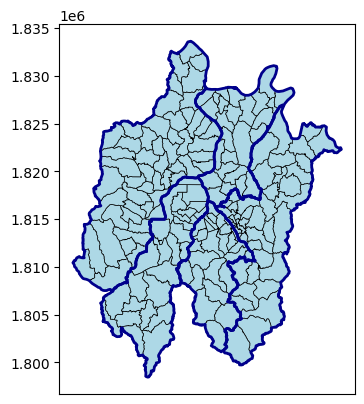

In [8]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.ticker import FixedLocator

# 법정동 플롯
base = TL_SCCO_EMD.plot(color='lightblue', edgecolor='k', linewidth=0.5)

# 구별 경계 플롯 (진한색 선으로)
TL_SCCO_SIG.boundary.plot(ax=base, color='darkblue', linewidth=2)

# 원하는 눈금 위치 설정
ticks_to_use = [127.25, 127.35, 127.45, 127.55]

# X축 눈금을 원하는 위치에 설정
plt.gca().xaxis.set_major_locator(FixedLocator(ticks_to_use))

# 플롯 표시
plt.show()


In [7]:
import geopandas as gpd

file_path ='/home/user/jin_jb/DTG/DATA/대전광역시/30000/TL_SPRD_MANAGE.shp'
TL_SPRD_MANAGE = gpd.read_file(file_path, encoding = 'cp949')

TL_SPRD_MANAGE

,ALWNC_DE,ALWNC_RESN,BSI_INT,ENG_RN,MVMN_DE,MVMN_RESN,MVM_RES_CD,NTFC_DE,OPERT_DE,RBP_CN,...,RDS_MAN_NO,REP_CN,RN,RN_CD,ROAD_BT,ROAD_LT,ROA_CLS_SE,SIG_CD,WDR_RD_CD,geometry
0,20101228,국토해양부 노선명을 이용하여 명명함,2000,Gyeongbu Expressway,20141030,직권수정(속성변경),99,20101228,20150318144835,부산 금정구(구서IC)/ 구서동 481-1도,...,6956,서울 서초구(한남IC)/ 잠원동 77도,경부고속도로,1000001,50.000,423200.000,1,30110,1,"LINESTRING (1001562.247 1816739.910, 1001549.5..."
1,20101228,국토해양부 노선명을 이용하여 명명함,2000,Tongyeong Daejeon Expressway,20141030,직권수정(속성변경),99,20101228,20190429165058,경남 통영시 용남면(통영IC)/ 동달리 1410-23구,...,6962,대전 동구 신상동(비룡JC)/ 비룡동 209-10도,통영대전고속도로,1000016,30.000,215250.000,1,30110,1,"LINESTRING (998362.553 1803692.707, 998117.918..."
2,20100423,국토해양부 노선명을 이용하여 명명함,2000,Daejeonnambusunhwan Expressway,20180531,광역도로 관리주체 변경(행안부 -> 시도),71,20101228,20180531190000,대전 유성구(서대전JC) / 원내동 474-8도,...,6958,대전 동구(산내JC)/ 대별동 374천,대전남부순환고속도로,1000035,30.000,13280.000,1,30110,2,"LINESTRING (993937.025 1809024.285, 993938.508..."
3,20090714,동서를관통하는도로의기능반영,20,Dongseo-daero,20141030,"광역도로 정비 및 부여사유, 부여방식 정비",90,20090714,20141030232450,삼성동458도,...,107,가양동665도,동서대로,2010003,3.000,16500.000,2,30110,2,"LINESTRING (992981.746 1815981.961, 992942.061..."
4,20090714,동서를관통하는도로의기능반영,20,Dongseo-daero,20141030,"광역도로 정비 및 부여사유, 부여방식 정비",90,20090714,20141030232449,삼성동458도,...,161,가양동665도,동서대로,2010003,3.000,16500.000,2,30110,2,"LINESTRING (993044.735 1816043.780, 993002.985..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9365,20100420,회덕로의시작지점에서부터약330m지점에서왼쪽으로분기되는도로,10,Hoedeok-ro 33beon-gil,20141030,"광역도로 정비 및 부여사유, 부여방식 정비",90,20100420,20141030232922,신대동502-16구,...,211,신대동447-6도,회덕로33번길,4304521,7.000,1214.000,4,30230,3,"LINESTRING (992787.087 1822363.617, 992773.447..."
9366,20100420,회덕로의시작지점에서부터약340m지점에서오른쪽으로분기되는도로,10,Hoedeok-ro 34beon-gil,20141030,"광역도로 정비 및 부여사유, 부여방식 정비",90,20100420,20141030232922,신대동502-16구,...,1025,신대동132-10도,회덕로34번길,4304522,7.000,161.000,4,30230,3,"LINESTRING (992926.147 1822599.068, 992936.484..."
9367,20100420,회덕로의시작지점에서부터약340m지점에서오른쪽으로분기되는도로,10,Hoedeok-ro 34beon-gil,20141030,"광역도로 정비 및 부여사유, 부여방식 정비",90,20100420,20141030232922,신대동502-16구,...,210,신대동132-10도,회덕로34번길,4304522,7.000,480.000,4,30230,3,"LINESTRING (992787.087 1822363.617, 992857.305..."
9368,20190628,"대덕대로의 시작지점에서 부터 약15,850m 지점에서 왼쪽으로 분기되는 도로",20,Daedeok-daero 1585beon-gil,20190628,"대덕대로의 시작지점에서 부터 약15,850m 지점에서 왼쪽으로 분기되는 도로",01,20190628,20190628163617,석봉동 778-0,...,3859,석봉동 522-4,대덕대로1585번길,4857125,19.199,501.130,4,30230,3,"LINESTRING (993186.470 1828098.150, 993179.773..."


In [16]:
import geopandas as gpd

file_path = '/home/user/jin_jb/DTG/DATA/LSMD_ADM_SECT_UMD_대전/LSMD_ADM_SECT_UMD_30_202312.shp'

gdf = gpd.read_file(file_path, encoding = 'cp949')

gdf

,EMD_CD,COL_ADM_SE,EMD_NM,SGG_OID,geometry
0,30110101,30110,원동,1476,"POLYGON ((127.43429 36.32904, 127.43431 36.329..."
1,30110102,30110,인동,1477,"POLYGON ((127.43909 36.32427, 127.43898 36.324..."
2,30110103,30110,효동,1478,"POLYGON ((127.44155 36.31926, 127.44162 36.319..."
3,30110104,30110,천동,1479,"POLYGON ((127.44675 36.31952, 127.44680 36.319..."
4,30110105,30110,가오동,1480,"POLYGON ((127.45415 36.31216, 127.45425 36.312..."
...,...,...,...,...,...
172,30230122,30230,부수동,1648,"POLYGON ((127.47616 36.44571, 127.47677 36.445..."
173,30230123,30230,황호동,1649,"POLYGON ((127.50279 36.45550, 127.50280 36.455..."
174,30230124,30230,삼정동,1650,"POLYGON ((127.46258 36.45616, 127.46329 36.455..."
175,30230125,30230,미호동,1651,"POLYGON ((127.48423 36.47580, 127.48428 36.475..."


# 영문 이름 추가

In [1]:
import pandas as pd

# 데이터프레임 로드 예시 (실제 데이터에 맞게 조정 필요)
# TL_SCCO_EMD = pd.read_csv('path_to_TL_SCCO_EMD.csv')
# gdf = pd.read_csv('path_to_gdf.csv')

# 두 데이터프레임 병합
merged_df = pd.merge(TL_SCCO_EMD[['EMD_CD', 'EMD_ENG_NM']], gdf, on='EMD_CD', how='inner')

# EMD_ENG_NM 열을 EMD_NM 열 바로 앞으로 이동
columns = list(merged_df.columns)
emd_nm_index = columns.index('EMD_NM')
columns.insert(emd_nm_index, columns.pop(columns.index('EMD_ENG_NM')))
merged_df = merged_df[columns]

# TL_SCCO_SIG와 merged_df 병합
final_df = pd.merge(merged_df, TL_SCCO_SIG[['SIG_CD', 'SIG_ENG_NM', 'SIG_KOR_NM']], left_on='COL_ADM_SE', right_on='SIG_CD', how='inner')

# SIG_ENG_NM과 SIG_KOR_NM 열을 EMD_NM 열 바로 앞으로 이동
columns = list(final_df.columns)
emd_nm_index = columns.index('EMD_NM')
# SIG_KOR_NM과 SIG_ENG_NM을 EMD_NM 앞으로 이동
columns.insert(emd_nm_index, columns.pop(columns.index('SIG_ENG_NM')))
columns.insert(emd_nm_index, columns.pop(columns.index('SIG_KOR_NM')))
final_df = final_df[columns]

# SIG_CD 열 제거
final_df = final_df.drop(columns=['SIG_CD'])

# EMD_NM 열의 이름을 EMD_KOR_NM으로 변경
final_df = final_df.rename(columns={'EMD_NM': 'EMD_KOR_NM'})

all_gdf = final_df

all_gdf



NameError: name 'TL_SCCO_EMD' is not defined

# 30110=동구, 30140=중구, 30170=서구, 30200=유성구, 30230=대덕구

In [11]:
# '동 이름'의 중복값을 찾습니다.
duplicate_dongs = gdf[gdf.duplicated('EMD_NM', keep=False)]

# 중복된 '동 이름'이 있는지 출력합니다.
duplicate_dongs

,EMD_CD,COL_ADM_SE,EMD_NM,SGG_OID,geometry
7,30110108,30110,삼정동,1483,"POLYGON ((127.48156 36.33162, 127.48175 36.331..."
9,30110110,30110,대동,1485,"POLYGON ((127.44092 36.32666, 127.44094 36.326..."
23,30110124,30110,용계동,1499,"POLYGON ((127.49529 36.38142, 127.49567 36.381..."
33,30110134,30110,오동,1509,"POLYGON ((127.52613 36.42090, 127.52622 36.420..."
90,30170121,30170,평촌동,1566,"POLYGON ((127.32486 36.22998, 127.32473 36.230..."
91,30170122,30170,오동,1567,"POLYGON ((127.32810 36.20408, 127.32805 36.204..."
101,30200104,30200,용계동,1792,"POLYGON ((127.30995 36.32204, 127.31016 36.322..."
125,30200128,30200,장동,1601,"POLYGON ((127.35045 36.40903, 127.35113 36.409..."
146,30200149,30200,대동,1622,"POLYGON ((127.40249 36.47322, 127.40112 36.473..."
167,30230117,30230,평촌동,1643,"POLYGON ((127.42870 36.44196, 127.42913 36.441..."


In [49]:
# 'COL_ADM_SE' 컬럼에서 값이 '30110'인 행의 개수를 계산합니다.
count_30110 = (gdf['COL_ADM_SE'] == '30110').sum()
count_30140 = (gdf['COL_ADM_SE'] == '30140').sum()
count_30170 = (gdf['COL_ADM_SE'] == '30170').sum()
count_30200 = (gdf['COL_ADM_SE'] == '30200').sum()
count_30230 = (gdf['COL_ADM_SE'] == '30230').sum()

print(f"30110 동구 법정동 개수:",count_30110)
print(f"30140 중구 법정동 개수:",count_30140)
print(f"30170 서구 법정동 개수:",count_30170)
print(f"30200 유성구 법정동 개수:",count_30200)
print(f"30230 대덕구 법정동 개수:",count_30230)

30110 동구 법정동 개수: 45
30140 중구 법정동 개수: 26
30170 서구 법정동 개수: 27
30200 유성구 법정동 개수: 53
30230 대덕구 법정동 개수: 26


# 사고데이터와 법정동 데이터 공간 조인

In [13]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point


# 교통사고 데이터의 공간 데이터 포인트 생성
dj_acc['geometry'] = dj_acc.apply(
    lambda row: Point(row['lon'], row['lat']), axis=1)
traffic_accident_gdf = gpd.GeoDataFrame(dj_acc, geometry='geometry')

gdf = gpd.GeoDataFrame(gdf)

# 공간 조인 수행
acc_gdf = gpd.sjoin(traffic_accident_gdf, gdf, how='left', predicate='within')

acc_gdf


/tmp/ipykernel_372410/752447752.py:14: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84" ...

  acc_gdf = gpd.sjoin(traffic_accident_gdf, gdf, how='left', predicate='within')


,ACC_YMD,HOUR,DAY_CD,BJD_CD,WEA_STA_CD,ACC_GRD_CD,DEATH_CNT,WND_CNT,lon,lat,geometry,index_right,EMD_CD,COL_ADM_SE,EMD_NM,SGG_OID
0,2019-01-01,3,3,3.020013e+09,1,3,0,1,127.372955,36.407769,POINT (127.37296 36.40777),126.0,30200129,30200,방현동,1602.0
1,2019-01-01,12,3,3.011010e+09,1,2,0,1,127.454109,36.306999,POINT (127.45411 36.30700),4.0,30110105,30110,가오동,1480.0
2,2019-01-01,13,3,3.014010e+09,1,3,0,1,127.415028,36.333411,POINT (127.41503 36.33341),47.0,30140103,30140,목동,761.0
3,2019-01-01,13,3,3.020011e+09,1,3,0,1,127.332033,36.351625,POINT (127.33203 36.35162),109.0,30200112,30200,구암동,1585.0
4,2019-01-01,18,3,3.020014e+09,2,4,0,1,127.313203,36.391300,POINT (127.31320 36.39130),136.0,30200139,30200,반석동,1612.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8332,2019-12-31,20,3,3.014011e+09,1,2,0,1,127.435187,36.316078,POINT (127.43519 36.31608),55.0,30140111,30140,부사동,1531.0
8333,2019-12-31,22,3,3.020011e+09,1,3,0,3,127.346471,36.348741,POINT (127.34647 36.34874),108.0,30200111,30200,봉명동,1788.0
8334,2019-12-31,22,3,3.023012e+09,1,3,0,3,127.420927,36.427734,POINT (127.42093 36.42773),166.0,30230116,30230,상서동,1642.0
8335,2019-12-31,22,3,3.020014e+09,1,2,0,1,127.311831,36.396221,POINT (127.31183 36.39622),136.0,30200139,30200,반석동,1612.0


<!-- 11대위험운전 count
월별 11대위험운전 count and drill-down
-> 가장 높은 달 추출 후 11대 위험운전 비교
(어떤 11위험운전이 있는지,
11대 위험운전 중 많은 것 추출 후 roll-up해서 전체 11대 위험운전과 비교
roll-up했을 때 )

(주말,평일의 차이가 있는지,
있다면 주말,평일 roll-up -> 전반적인 결과 도출
차이가 있다거나, 없다거나)

시간대별 차이가 있는지,
있다면 시간대별 roll-up -> 전반적인 결과 도출
차이가 있다면 있는 시간대 drill-down해도 되고 안해도 되고)

가장 높은 달 교통사고량 drill-down

구->동 

11대 위험운전과 join후 교통사고량과 위험운전과의 상관관계 분석 -->

# 대전시 구 별 경계면 데이터 추출

In [14]:
import geopandas as gpd

file_path = '/home/user/jin_jb/DTG/DATA/LSMD_ADM_SECT_UMD_대전/LSMD_ADM_SECT_UMD_30_202312.shp'

emd_gdf = gpd.read_file(file_path, encoding = 'cp949')

# 구별로 법정동 경계면 데이터 병합
gu_gdf = emd_gdf.dissolve(by='COL_ADM_SE').reset_index()

# EMD_CD와 SGG_OID 열 제거
gu_gdf.drop(['EMD_CD', 'SGG_OID'], axis=1, inplace=True)

# COL_ADM_SE 값을 기준으로 EMD_NM 열의 값을 구 이름으로 변경
gu_names = {
    '30110': '동구',
    '30140': '중구',
    '30170': '서구',
    '30200': '유성구',
    '30230': '대덕구'
}

gu_gdf['EMD_NM'] = gu_gdf['COL_ADM_SE'].map(gu_names)

# 결과 확인
gu_gdf

,COL_ADM_SE,geometry,EMD_NM
0,30110,"POLYGON ((127.45409 36.20659, 127.45417 36.206...",동구
1,30140,"POLYGON ((127.40044 36.23303, 127.40023 36.232...",중구
2,30170,"MULTIPOLYGON (((127.36243 36.23349, 127.36244 ...",서구
3,30200,"POLYGON ((127.29113 36.26541, 127.29098 36.265...",유성구
4,30230,"POLYGON ((127.42725 36.35251, 127.42733 36.352...",대덕구


In [15]:
# 현재 CRS 확인
print("현재 CRS:", gu_gdf.crs)

# CRS를 EPSG:4326으로 설정 (필요한 경우)
if gu_gdf.crs != "EPSG:4326":
    gu_gdf = gu_gdf.set_crs("EPSG:4326", allow_override=True)
    print("CRS를 EPSG:4326으로 변경했습니다.")
else:
    print("CRS는 이미 EPSG:4326입니다.")


현재 CRS: GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433],AXIS["Longitude",EAST],AXIS["Latitude",NORTH]]
CRS를 EPSG:4326으로 변경했습니다.


In [16]:
import geopandas as gpd
from shapely import wkt
import matplotlib.pyplot as plt

# 형식 검증
valid_geo = gu_gdf['geometry'].is_valid
if valid_geo.all():
    print("모든 지오메트리가 유효합니다.")
else:
    print("일부 지오메트리가 유효하지 않습니다.")


일부 지오메트리가 유효하지 않습니다.


In [17]:
# 유효하지 않은 지오메트리를 가진 행 찾기
invalid_geo = gu_gdf[~valid_geo]

# 유효하지 않은 지오메트리 출력
print(invalid_geo)


  COL_ADM_SE                                           geometry EMD_NM
2      30170  MULTIPOLYGON (((127.36243 36.23349, 127.36244 ...     서구


In [18]:
# 유효하지 않은 지오메트리를 'buffer(0)'을 사용하여 수정
gu_gdf['geometry'] = gu_gdf['geometry'].buffer(0)

# 다시 유효성 검사를 수행
valid_geo = gu_gdf['geometry'].is_valid
if valid_geo.all():
    print("모든 지오메트리가 이제 유효합니다.")
else:
    print("여전히 유효하지 않은 지오메트리가 있습니다.")


모든 지오메트리가 이제 유효합니다.


In [19]:
gu_gdf

,COL_ADM_SE,geometry,EMD_NM
0,30110,"POLYGON ((127.45409 36.20659, 127.45417 36.206...",동구
1,30140,"POLYGON ((127.37833 36.29306, 127.37833 36.293...",중구
2,30170,"POLYGON ((127.35414 36.33305, 127.35414 36.333...",서구
3,30200,"POLYGON ((127.29113 36.26541, 127.29098 36.265...",유성구
4,30230,"POLYGON ((127.42725 36.35251, 127.42733 36.352...",대덕구


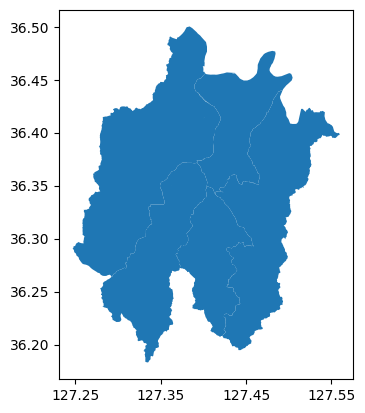

In [20]:
from matplotlib.ticker import FixedLocator
import geopandas as gpd
import matplotlib.pyplot as plt

# 가정: gu_gdf는 이미 로드된 GeoDataFrame 객체입니다.
gu_gdf.plot()

# 원하는 눈금 위치 설정
ticks_to_use = [127.25, 127.35, 127.45, 127.55]

# X축 눈금을 원하는 위치에 설정
plt.gca().xaxis.set_major_locator(FixedLocator(ticks_to_use))

# 그래프 표시
plt.show()


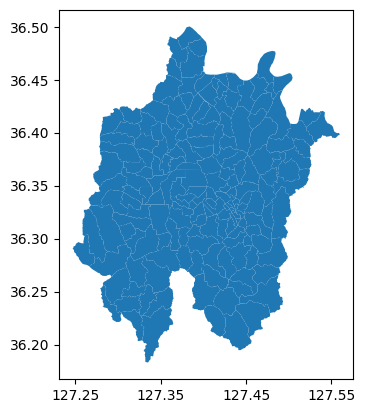

In [21]:
from matplotlib.ticker import FixedLocator
import geopandas as gpd
import matplotlib.pyplot as plt

# 가정: gu_gdf는 이미 로드된 GeoDataFrame 객체입니다.
gdf.plot()

# 원하는 눈금 위치 설정
ticks_to_use = [127.25, 127.35, 127.45, 127.55]

# X축 눈금을 원하는 위치에 설정
plt.gca().xaxis.set_major_locator(FixedLocator(ticks_to_use))

# 그래프 표시
plt.show()


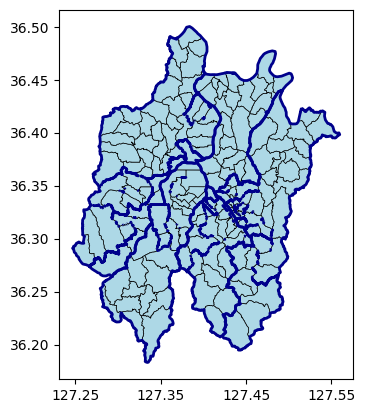

In [22]:
import geopandas as gpd
import matplotlib.pyplot as plt

# 법정동 플롯
base = gdf.plot(color='lightblue', edgecolor='k', linewidth=0.5)

# 구별 경계 플롯 (진한색 선으로)
gu_gdf.boundary.plot(ax=base, color='darkblue', linewidth=2)

# 원하는 눈금 위치 설정
ticks_to_use = [127.25, 127.35, 127.45, 127.55]

# X축 눈금을 원하는 위치에 설정
plt.gca().xaxis.set_major_locator(FixedLocator(ticks_to_use))

# 플롯 표시
plt.show()


# 법정동 공간조인 = acc_gdf, 구 공간조인 = acc_gu_gdf

# DTG + 법정동 공간조인(모든 DTG데이터에 동이 뜨도록)

In [7]:
import geopandas as gpd

file_path = '/home/user/jin_jb/DTG/DATA/LSMD_ADM_SECT_UMD_대전/LSMD_ADM_SECT_UMD_30_202312.shp'

gdf = gpd.read_file(file_path, encoding = 'cp949')

gdf

,EMD_CD,COL_ADM_SE,EMD_NM,SGG_OID,geometry
0,30110101,30110,원동,1476,"POLYGON ((127.43429 36.32904, 127.43431 36.329..."
1,30110102,30110,인동,1477,"POLYGON ((127.43909 36.32427, 127.43898 36.324..."
2,30110103,30110,효동,1478,"POLYGON ((127.44155 36.31926, 127.44162 36.319..."
3,30110104,30110,천동,1479,"POLYGON ((127.44675 36.31952, 127.44680 36.319..."
4,30110105,30110,가오동,1480,"POLYGON ((127.45415 36.31216, 127.45425 36.312..."
...,...,...,...,...,...
172,30230122,30230,부수동,1648,"POLYGON ((127.47616 36.44571, 127.47677 36.445..."
173,30230123,30230,황호동,1649,"POLYGON ((127.50279 36.45550, 127.50280 36.455..."
174,30230124,30230,삼정동,1650,"POLYGON ((127.46258 36.45616, 127.46329 36.455..."
175,30230125,30230,미호동,1651,"POLYGON ((127.48423 36.47580, 127.48428 36.475..."


In [1]:
import geopandas as gpd

file_path = '/home/user/jin_jb/DTG/DATA/all_gdf.shp'

all_gdf = gpd.read_file(file_path, encoding = 'cp949')

all_gdf

,EMD_CD,COL_ADM_SE,SIG_ENG_NM,EMD_ENG_NM,geometry
0,30110101,30110,Dong-gu,Won-dong,"POLYGON ((127.43429 36.32904, 127.43431 36.329..."
1,30110102,30110,Dong-gu,In-dong,"POLYGON ((127.43909 36.32427, 127.43898 36.324..."
2,30110103,30110,Dong-gu,Hyo-dong,"POLYGON ((127.44155 36.31926, 127.44162 36.319..."
3,30110104,30110,Dong-gu,Cheon-dong,"POLYGON ((127.44675 36.31952, 127.44680 36.319..."
4,30110105,30110,Dong-gu,Gao-dong,"POLYGON ((127.45415 36.31216, 127.45425 36.312..."
...,...,...,...,...,...
172,30230122,30230,Daedeok-gu,Busu-dong,"POLYGON ((127.47616 36.44571, 127.47677 36.445..."
173,30230123,30230,Daedeok-gu,Hwangho-dong,"POLYGON ((127.50279 36.45550, 127.50280 36.455..."
174,30230124,30230,Daedeok-gu,Samjeong-dong,"POLYGON ((127.46258 36.45616, 127.46329 36.455..."
175,30230125,30230,Daedeok-gu,Miho-dong,"POLYGON ((127.48423 36.47580, 127.48428 36.475..."


In [2]:
import pandas as pd
DTG_11 = pd.read_pickle('/home/user/jin_jb/DTG/DATA/DTG_11.pkl')
DTG_11

all_gdf = gpd.GeoDataFrame(all_gdf, geometry='geometry')

joined_data = gpd.sjoin(DTG_11, all_gdf, how='left', predicate='within')

# 인덱스를 추가하여 각 행을 고유하게 식별
joined_data.reset_index(inplace=True)

# 고유 식별자를 포함하여 중복 제거
joined_data_unique = joined_data.drop_duplicates(subset=['index'] + ['OPT_DT', 'TRANSCO_CD', 'CAR_REG_NO', 'OPT_HHMISSSS', 'OPT_SPD', 'Speeding', 'Long-term speeding', 
                                                                     'Sudden acceleration', 'Sudden start', 'Sudden deceleration', 'Sudden stop', 'Sudden left turn', 
                                                                     'Sudden right turn', 'Sudden U-turn', 'Sudden overtaking', 'Sudden lane change', 'geometry'])

print(f"조인 DTG_11 행 수: {DTG_11.shape[0]}")
print(f"중복 제거 전 행 수: {joined_data.shape[0]}")
print(f"중복 제거 후 행 수: {joined_data_unique.shape[0]}")

/tmp/ipykernel_710254/3608349887.py:7: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  joined_data = gpd.sjoin(DTG_11, all_gdf, how='left', predicate='within')


조인 DTG_11 행 수: 11134657
중복 제거 전 행 수: 11136637
중복 제거 후 행 수: 11134657


In [3]:
import pandas as pd
import numpy as np

EMD_DTG_11 = joined_data_unique.drop(['index','CAR_REG_NO','TRIP_ID','OPT_SPD','geometry','index_right'], axis = 1)
# EMD_CD가 NaN인 행 제거
EMD_DTG_11 = EMD_DTG_11.dropna(subset=['EMD_CD'])

# TRANSCO_CD 열을 int로 변환을 시도합니다. 실패하면 NaN으로 설정됩니다.
EMD_DTG_11['TRANSCO_CD'] = pd.to_numeric(EMD_DTG_11['TRANSCO_CD'], errors='coerce')

# 변환에 실패한 행 (NaN이 있는 행) 제거
EMD_DTG_11 = EMD_DTG_11.dropna(subset=['TRANSCO_CD'])

# TRANSCO_CD 열을 int 타입으로 변환
EMD_DTG_11['TRANSCO_CD'] = EMD_DTG_11['TRANSCO_CD'].astype('int64')

# 'EMD_CD'을 기준으로 그룹화하고, 합계를 계산할 컬럼들만 선택하여 합계를 계산합니다.
EMD_DTG_11= EMD_DTG_11.groupby(['TRANSCO_CD','COL_ADM_SE','SIG_ENG_NM','EMD_CD','EMD_ENG_NM'])[['Speeding', 'Long-term speeding', 'Sudden acceleration', 'Sudden start', 
                                'Sudden deceleration', 'Sudden stop', 'Sudden left turn', 'Sudden right turn', 
                                'Sudden U-turn', 'Sudden overtaking', 'Sudden lane change']].sum().reset_index()

EMD_DTG_11['COL_ADM_SE'] = EMD_DTG_11['COL_ADM_SE'].astype(int)
EMD_DTG_11['EMD_CD'] = EMD_DTG_11['EMD_CD'].astype(int)

# 결과를 출력합니다.
EMD_DTG_11


,TRANSCO_CD,COL_ADM_SE,SIG_ENG_NM,EMD_CD,EMD_ENG_NM,Speeding,Long-term speeding,Sudden acceleration,Sudden start,Sudden deceleration,Sudden stop,Sudden left turn,Sudden right turn,Sudden U-turn,Sudden overtaking,Sudden lane change
0,16,30200,Yuseong-gu,30200120,Jijok-dong,0,0,1,0,0,0,0,0,0,0,0
1,39,30110,Dong-gu,30110108,Samjeong-dong,0,0,0,0,0,0,0,0,0,0,2
2,39,30230,Daedeok-gu,30230110,Birae-dong,1,0,1,0,0,0,0,0,0,0,0
3,41,30110,Dong-gu,30110138,Isa-dong,0,0,0,0,0,1,0,0,0,0,0
4,41,30200,Yuseong-gu,30200112,Guam-dong,0,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
100214,2827416,30230,Daedeok-gu,30230114,Sinil-dong,0,0,1,0,1,0,0,0,0,0,0
100215,2827416,30230,Daedeok-gu,30230115,Deogam-dong,12,0,1,0,0,0,0,0,0,0,0
100216,2827416,30230,Daedeok-gu,30230116,Sangseo-dong,36,0,1,0,0,0,0,0,0,0,0
100217,2827416,30230,Daedeok-gu,30230117,Pyeongchon-dong,0,0,1,0,0,0,0,0,0,0,0


In [4]:
EMD_DTG_11.to_pickle("/home/user/jin_jb/DTG/DATA/EMD_DTG_11.pkl")

In [5]:
import pandas as pd
pd.read_pickle("/home/user/jin_jb/DTG/DATA/EMD_DTG_11.pkl")

,TRANSCO_CD,COL_ADM_SE,SIG_ENG_NM,EMD_CD,EMD_ENG_NM,Speeding,Long-term speeding,Sudden acceleration,Sudden start,Sudden deceleration,Sudden stop,Sudden left turn,Sudden right turn,Sudden U-turn,Sudden overtaking,Sudden lane change
0,16,30200,Yuseong-gu,30200120,Jijok-dong,0,0,1,0,0,0,0,0,0,0,0
1,39,30110,Dong-gu,30110108,Samjeong-dong,0,0,0,0,0,0,0,0,0,0,2
2,39,30230,Daedeok-gu,30230110,Birae-dong,1,0,1,0,0,0,0,0,0,0,0
3,41,30110,Dong-gu,30110138,Isa-dong,0,0,0,0,0,1,0,0,0,0,0
4,41,30200,Yuseong-gu,30200112,Guam-dong,0,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
100214,2827416,30230,Daedeok-gu,30230114,Sinil-dong,0,0,1,0,1,0,0,0,0,0,0
100215,2827416,30230,Daedeok-gu,30230115,Deogam-dong,12,0,1,0,0,0,0,0,0,0,0
100216,2827416,30230,Daedeok-gu,30230116,Sangseo-dong,36,0,1,0,0,0,0,0,0,0,0
100217,2827416,30230,Daedeok-gu,30230117,Pyeongchon-dong,0,0,1,0,0,0,0,0,0,0,0


: 

In [25]:
import pandas as pd
import gc

# 각 DTG 데이터프레임을 불러옵니다
dtg_dataframes = {}
for i in range(1, 13):
    dtg_var_name = f'EMD_DTG_{i:02d}'
    dtg_dataframes[dtg_var_name] = pd.read_pickle(f'/home/user/jin_jb/DTG/DATA/{dtg_var_name}.pkl')

# 예시: DTG_01 데이터프레임에 접근
EMD_DTG_01 = dtg_dataframes['EMD_DTG_01']
EMD_DTG_02 = dtg_dataframes['EMD_DTG_02']
EMD_DTG_03 = dtg_dataframes['EMD_DTG_03']
EMD_DTG_04 = dtg_dataframes['EMD_DTG_04']
EMD_DTG_05 = dtg_dataframes['EMD_DTG_05']
EMD_DTG_06 = dtg_dataframes['EMD_DTG_06']
EMD_DTG_07 = dtg_dataframes['EMD_DTG_07']
EMD_DTG_08 = dtg_dataframes['EMD_DTG_08']
EMD_DTG_09 = dtg_dataframes['EMD_DTG_09']
EMD_DTG_10 = dtg_dataframes['EMD_DTG_10']
EMD_DTG_11 = dtg_dataframes['EMD_DTG_11']
EMD_DTG_12 = dtg_dataframes['EMD_DTG_12']


df_list = [EMD_DTG_01, EMD_DTG_02, EMD_DTG_03, EMD_DTG_04, EMD_DTG_05, 
           EMD_DTG_06, EMD_DTG_07, EMD_DTG_08, EMD_DTG_09, EMD_DTG_10, 
           EMD_DTG_11, EMD_DTG_12]

EMD_DTG = pd.concat(df_list, ignore_index=True)

EMD_DTG = EMD_DTG.groupby(['EMD_CD','EMD_NM','COL_ADM_SE'])[['Speeding', 'Long-term speeding', 'Sudden acceleration', 'Sudden start', 
                                'Sudden deceleration', 'Sudden stop', 'Sudden left turn', 'Sudden right turn', 
                                'Sudden U-turn', 'Sudden overtaking', 'Sudden lane change']].sum().reset_index()

EMD_DTG

,EMD_CD,EMD_NM,COL_ADM_SE,Speeding,Long-term speeding,Sudden acceleration,Sudden start,Sudden deceleration,Sudden stop,Sudden left turn,Sudden right turn,Sudden U-turn,Sudden overtaking,Sudden lane change
0,30110101,원동,30110,35498,0,290601,558,85123,20008,60803,26340,3732,12308,33822
1,30110102,인동,30110,40729,0,204942,315,78260,17852,30755,11334,3260,14783,44908
2,30110103,효동,30110,37400,0,144047,239,46982,12445,19173,8369,4077,10670,35239
3,30110104,천동,30110,53901,0,91823,133,37503,6576,5065,3455,996,3152,12095
4,30110105,가오동,30110,31755,0,287850,498,102212,28986,63663,31556,21477,13619,44222
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
172,30230122,부수동,30230,5,0,25,0,13,2,2,1,0,0,1
173,30230123,황호동,30230,0,0,26,0,16,13,2,2,3,0,8
174,30230124,삼정동,30230,1874,0,1449,3,3576,425,7090,6428,45,333,3798
175,30230125,미호동,30230,1354,0,4178,3,12929,1398,4402,1353,287,617,3472


In [ ]:
# EMD_DTG.to_pickle("/home/user/jin_jb/DTG/DATA/EMD_DTG.pkl")

In [26]:
import pandas as pd
EMD_DTG = pd.read_pickle("/home/user/jin_jb/DTG/DATA/EMD_DTG.pkl")
EMD_DTG

,EMD_CD,EMD_NM,COL_ADM_SE,Speeding,Long-term speeding,Sudden acceleration,Sudden start,Sudden deceleration,Sudden stop,Sudden left turn,Sudden right turn,Sudden U-turn,Sudden overtaking,Sudden lane change
0,30110101,원동,30110,35498,0,290601,558,85123,20008,60803,26340,3732,12308,33822
1,30110102,인동,30110,40729,0,204942,315,78260,17852,30755,11334,3260,14783,44908
2,30110103,효동,30110,37400,0,144047,239,46982,12445,19173,8369,4077,10670,35239
3,30110104,천동,30110,53901,0,91823,133,37503,6576,5065,3455,996,3152,12095
4,30110105,가오동,30110,31755,0,287850,498,102212,28986,63663,31556,21477,13619,44222
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
172,30230122,부수동,30230,5,0,25,0,13,2,2,1,0,0,1
173,30230123,황호동,30230,0,0,26,0,16,13,2,2,3,0,8
174,30230124,삼정동,30230,1874,0,1449,3,3576,425,7090,6428,45,333,3798
175,30230125,미호동,30230,1354,0,4178,3,12929,1398,4402,1353,287,617,3472


In [27]:
EMD_GU_DTG = EMD_DTG.groupby('COL_ADM_SE')[['Speeding', 'Long-term speeding', 'Sudden acceleration', 'Sudden start', 
                                'Sudden deceleration', 'Sudden stop', 'Sudden left turn', 'Sudden right turn', 
                                'Sudden U-turn', 'Sudden overtaking', 'Sudden lane change']].sum().reset_index()

EMD_GU_DTG

,COL_ADM_SE,Speeding,Long-term speeding,Sudden acceleration,Sudden start,Sudden deceleration,Sudden stop,Sudden left turn,Sudden right turn,Sudden U-turn,Sudden overtaking,Sudden lane change
0,30110,2636929,0,7996465,13425,2873550,785574,1184329,551779,177035,393493,1443006
1,30140,1280925,0,7284397,14889,2451018,884828,697212,377855,71656,402082,1273659
2,30170,2241955,0,11488917,25497,3920697,1432238,1144398,671915,147513,533578,1734604
3,30200,3555727,0,8733065,17359,4223966,1346988,1565259,1170552,231530,418459,1768641
4,30230,3627792,0,6859754,13701,2915028,838434,869985,525932,173051,401066,1649838


In [31]:
# COL_ADM_SE 값을 기준으로 EMD_NM 열의 값을 구 이름으로 변경
gu_names = {
    '30110': 'Dong-gu',
    '30140': 'Jung-gu',
    '30170': 'Seo-gu',
    '30200': 'Yuseong-gu',
    '30230': 'Daedeok-gu'
}

EMD_GU_DTG['GU_NM'] = EMD_GU_DTG['COL_ADM_SE'].map(gu_names)

# 결과 확인
EMD_GU_DTG

,COL_ADM_SE,Speeding,Long-term speeding,Sudden acceleration,Sudden start,Sudden deceleration,Sudden stop,Sudden left turn,Sudden right turn,Sudden U-turn,Sudden overtaking,Sudden lane change,GU_NM,Total_sum
0,30110,2636929,0,7996465,13425,2873550,785574,1184329,551779,177035,393493,1443006,Dong-gu,18055585
1,30140,1280925,0,7284397,14889,2451018,884828,697212,377855,71656,402082,1273659,Jung-gu,14738521
2,30170,2241955,0,11488917,25497,3920697,1432238,1144398,671915,147513,533578,1734604,Seo-gu,23341312
3,30200,3555727,0,8733065,17359,4223966,1346988,1565259,1170552,231530,418459,1768641,Yuseong-gu,23031546
4,30230,3627792,0,6859754,13701,2915028,838434,869985,525932,173051,401066,1649838,Daedeok-gu,17874581


In [32]:
EMD_GU_DTG['Total_sum'] = EMD_GU_DTG[['Speeding','Long-term speeding','Sudden acceleration','Sudden start','Sudden deceleration','Sudden stop',
                                      'Sudden left turn','Sudden right turn','Sudden U-turn','Sudden overtaking','Sudden lane change']].sum(axis = 1)
EMD_GU_DTG

,COL_ADM_SE,Speeding,Long-term speeding,Sudden acceleration,Sudden start,Sudden deceleration,Sudden stop,Sudden left turn,Sudden right turn,Sudden U-turn,Sudden overtaking,Sudden lane change,GU_NM,Total_sum
0,30110,2636929,0,7996465,13425,2873550,785574,1184329,551779,177035,393493,1443006,Dong-gu,18055585
1,30140,1280925,0,7284397,14889,2451018,884828,697212,377855,71656,402082,1273659,Jung-gu,14738521
2,30170,2241955,0,11488917,25497,3920697,1432238,1144398,671915,147513,533578,1734604,Seo-gu,23341312
3,30200,3555727,0,8733065,17359,4223966,1346988,1565259,1170552,231530,418459,1768641,Yuseong-gu,23031546
4,30230,3627792,0,6859754,13701,2915028,838434,869985,525932,173051,401066,1649838,Daedeok-gu,17874581


In [48]:
pd.DataFrame(EMD_GU_DTG[['GU_NM','Total_sum']])

,GU_NM,Total_sum
0,Dong-gu,18055585
1,Jung-gu,14738521
2,Seo-gu,23341312
3,Yuseong-gu,23031546
4,Daedeok-gu,17874581


In [42]:
melted_data

,District Name,Category,Count
0,Dong-gu,Speeding,2636929
1,Jung-gu,Speeding,1280925
2,Seo-gu,Speeding,2241955
3,Yuseong-gu,Speeding,3555727
4,Daedeok-gu,Speeding,3627792
5,Dong-gu,Long-term speeding,0
6,Jung-gu,Long-term speeding,0
7,Seo-gu,Long-term speeding,0
8,Yuseong-gu,Long-term speeding,0
9,Daedeok-gu,Long-term speeding,0


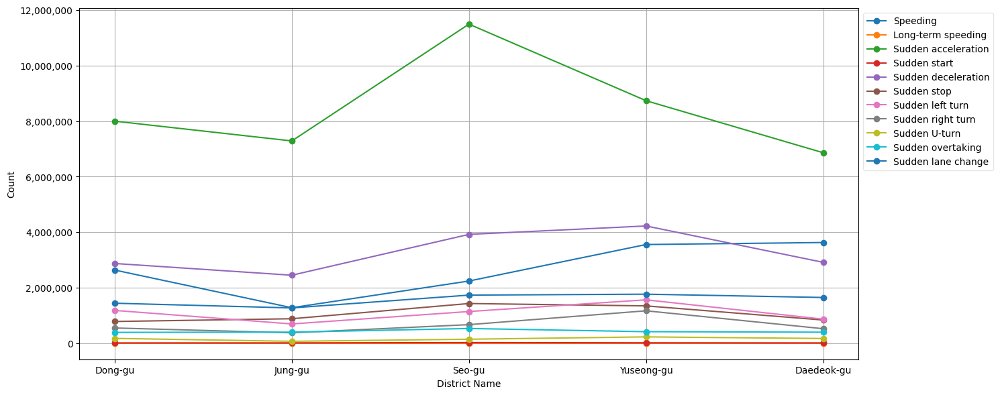

In [41]:
# 필요한 라이브러리 불러오기
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

# 데이터프레임 재구조화
melted_data = EMD_GU_DTG.reset_index().melt(id_vars='GU_NM', value_vars=["Speeding", 
    "Long-term speeding", "Sudden acceleration", "Sudden start", "Sudden deceleration", 
    "Sudden stop", "Sudden left turn", "Sudden right turn", "Sudden U-turn", 
    "Sudden overtaking", "Sudden lane change"])
melted_data.columns = ['District Name', 'Category', 'Count']

# 그래프 그리기
plt.figure(figsize=(15, 6))
for category in melted_data['Category'].unique():
    category_data = melted_data[melted_data['Category'] == category]
    plt.plot(category_data['District Name'], category_data['Count'], marker='o', label=category)

x_labels = ['Dong-gu', 'Jung-gu', 'Seo-gu', 'Yuseong-gu', 'Daedeok-gu']
plt.xticks(ticks=range(len(x_labels)), labels=x_labels, rotation=0)
plt.xlabel('District Name')
plt.ylabel('Count')
# plt.title('The 11 Dangerous Driving Behaviors by Month')
# y축 레이블 형식 변경
plt.gca().ticklabel_format(style='plain', axis='y')
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))

# 레전드 투명도 조절
plt.legend(loc='upper left', bbox_to_anchor=(1,1), framealpha=0.5)

plt.tight_layout()
plt.grid(True)
plt.show()

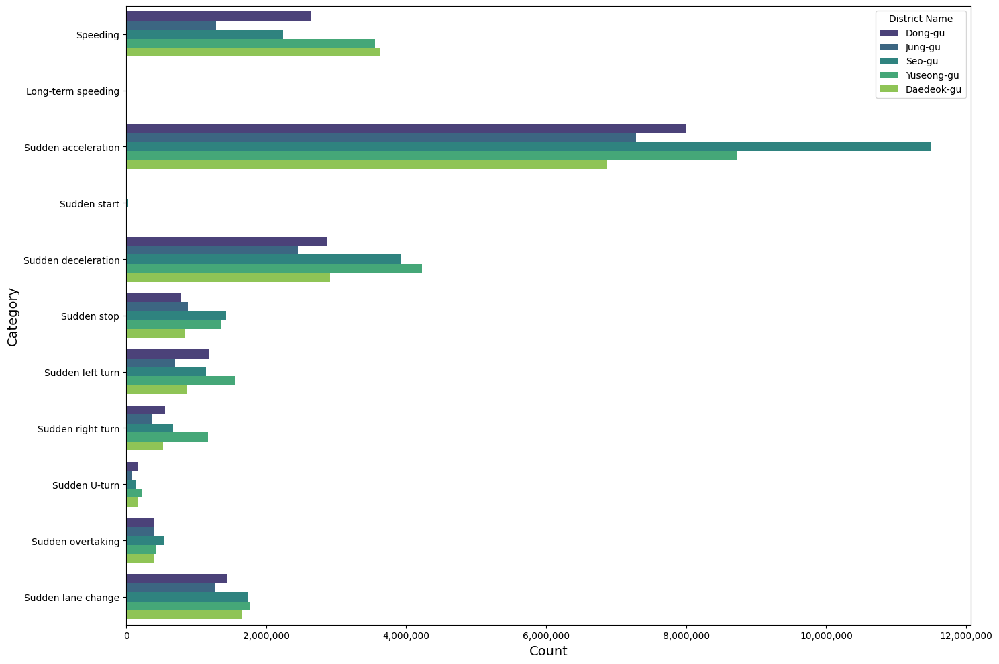

In [44]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 데이터프레임 재구조화
melted_data = EMD_GU_DTG.reset_index().melt(id_vars='GU_NM', value_vars=["Speeding", 
    "Long-term speeding", "Sudden acceleration", "Sudden start", "Sudden deceleration", 
    "Sudden stop", "Sudden left turn", "Sudden right turn", "Sudden U-turn", 
    "Sudden overtaking", "Sudden lane change"])
melted_data.columns = ['District Name', 'Category', 'Count']

# Seaborn을 사용하여 구별로 11대 위험운전 카테고리별 카운트를 시각화
plt.figure(figsize=(15, 10))
sns.barplot(x="Count", y="Category", hue="District Name", data=melted_data, palette="viridis")

# plt.title("11 Major Risky Driving Behaviors by District", fontsize=16)
plt.xlabel("Count", fontsize=14)
plt.ylabel("Category", fontsize=14)
plt.legend(title="District Name")
plt.gca().ticklabel_format(style='plain', axis='x')
plt.gca().xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
plt.tight_layout()
plt.show()


### 서구와 유성구의 total_sum은 비슷하지만 유성구의 법정동은 53개, 서구의 법정동은 그에 비해 27개로 약 50%작은 편
### 그래서 서구로 선택하고 분석 진행

In [30]:
SEOGU_DTG = EMD_DTG[EMD_DTG['COL_ADM_SE'] == '30170']
SEOGU_DTG['Total_sum'] = SEOGU_DTG[['Speeding','Long-term speeding','Sudden acceleration','Sudden start','Sudden deceleration','Sudden stop',
                                    'Sudden left turn','Sudden right turn','Sudden U-turn','Sudden overtaking','Sudden lane change']].sum(axis = 1)
SEOGU_DTG

/tmp/ipykernel_346628/996457400.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  SEOGU_DTG['Total_sum'] = SEOGU_DTG[['Speeding','Long-term speeding','Sudden acceleration','Sudden start','Sudden deceleration','Sudden stop',


,EMD_CD,EMD_NM,COL_ADM_SE,Speeding,Long-term speeding,Sudden acceleration,Sudden start,Sudden deceleration,Sudden stop,Sudden left turn,Sudden right turn,Sudden U-turn,Sudden overtaking,Sudden lane change,Total_sum
71,30170101,복수동,30170,24403,0,351092,334,128956,35175,74124,34560,3836,20202,57402,730084
72,30170102,변동,30170,58981,0,457144,905,125761,49257,14428,7509,3179,24015,67802,808981
73,30170103,도마동,30170,108896,0,1068049,2241,375713,128056,78298,24670,13249,79162,264296,2142630
74,30170104,정림동,30170,98892,0,276249,430,148491,42403,16011,9927,3161,16176,78121,689861
75,30170105,용문동,30170,58390,0,427356,1406,111063,61115,52462,18226,2273,12088,35884,780263
76,30170106,탄방동,30170,115194,0,789269,2176,228953,92893,81061,53378,8893,28147,73966,1473930
77,30170108,괴정동,30170,57944,0,354040,1262,84858,37920,12513,10823,3144,23774,63542,649820
78,30170109,가장동,30170,21922,0,407210,673,125583,83239,20193,10549,1061,14499,41906,726835
79,30170110,내동,30170,47836,0,506280,975,171428,72310,40466,15506,5125,30844,93806,984576
80,30170111,갈마동,30170,122658,0,887413,2893,264805,122205,55715,36564,11265,40348,123156,1667022


# ------- 사고와 결합 ----------

# 사고 데이터와 구별 경계면 데이터 공간조인

In [25]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point


# 교통사고 데이터의 공간 데이터 포인트 생성
dj_acc['geometry'] = dj_acc.apply(
    lambda row: Point(row['lon'], row['lat']), axis=1)
traffic_accident_gu_gdf = gpd.GeoDataFrame(dj_acc, geometry='geometry')

# 공간 조인 수행
acc_gu_gdf = gpd.sjoin(traffic_accident_gu_gdf, gu_gdf, how='left', predicate='within')

/tmp/ipykernel_149652/3060248254.py:12: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  acc_gu_gdf = gpd.sjoin(traffic_accident_gu_gdf, gu_gdf, how='left', predicate='within')


In [27]:
acc_gu_gdf

,ACC_YMD,HOUR,DAY_CD,BJD_CD,ACC_GRD_CD,DEATH_CNT,WND_CNT,lon,lat,geometry,index_right,COL_ADM_SE,EMD_NM
0,2019-01-01,3,3,3.020013e+09,3,0,1,127.372955,36.407769,POINT (127.37296 36.40777),3.0,30200,유성구
1,2019-01-01,12,3,3.011010e+09,2,0,1,127.454109,36.306999,POINT (127.45411 36.30700),0.0,30110,동구
2,2019-01-01,13,3,3.014010e+09,3,0,1,127.415028,36.333411,POINT (127.41503 36.33341),1.0,30140,중구
3,2019-01-01,13,3,3.020011e+09,3,0,1,127.332033,36.351625,POINT (127.33203 36.35162),3.0,30200,유성구
4,2019-01-01,18,3,3.020014e+09,4,0,1,127.313203,36.391300,POINT (127.31320 36.39130),3.0,30200,유성구
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8332,2019-12-31,20,3,3.014011e+09,2,0,1,127.435187,36.316078,POINT (127.43519 36.31608),1.0,30140,중구
8333,2019-12-31,22,3,3.020011e+09,3,0,3,127.346471,36.348741,POINT (127.34647 36.34874),3.0,30200,유성구
8334,2019-12-31,22,3,3.023012e+09,3,0,3,127.420927,36.427734,POINT (127.42093 36.42773),4.0,30230,대덕구
8335,2019-12-31,22,3,3.020014e+09,2,0,1,127.311831,36.396221,POINT (127.31183 36.39622),3.0,30200,유성구


# COL_ADM_SE의 값중에 nan값 3개 발견 전처리

In [28]:
 acc_gu_gdf['COL_ADM_SE'].isna().sum()

3

In [29]:
# 'COL_ADM_SE' 열에서 nan 값을 가진 행을 제거
acc_gu_gdf = acc_gu_gdf.dropna(subset=['COL_ADM_SE'])

# 결과 확인
print(acc_gu_gdf['COL_ADM_SE'].unique())


['30200' '30110' '30140' '30170' '30230']


In [30]:
acc_gu_gdf

,ACC_YMD,HOUR,DAY_CD,BJD_CD,ACC_GRD_CD,DEATH_CNT,WND_CNT,lon,lat,geometry,index_right,COL_ADM_SE,EMD_NM
0,2019-01-01,3,3,3.020013e+09,3,0,1,127.372955,36.407769,POINT (127.37296 36.40777),3.0,30200,유성구
1,2019-01-01,12,3,3.011010e+09,2,0,1,127.454109,36.306999,POINT (127.45411 36.30700),0.0,30110,동구
2,2019-01-01,13,3,3.014010e+09,3,0,1,127.415028,36.333411,POINT (127.41503 36.33341),1.0,30140,중구
3,2019-01-01,13,3,3.020011e+09,3,0,1,127.332033,36.351625,POINT (127.33203 36.35162),3.0,30200,유성구
4,2019-01-01,18,3,3.020014e+09,4,0,1,127.313203,36.391300,POINT (127.31320 36.39130),3.0,30200,유성구
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8332,2019-12-31,20,3,3.014011e+09,2,0,1,127.435187,36.316078,POINT (127.43519 36.31608),1.0,30140,중구
8333,2019-12-31,22,3,3.020011e+09,3,0,3,127.346471,36.348741,POINT (127.34647 36.34874),3.0,30200,유성구
8334,2019-12-31,22,3,3.023012e+09,3,0,3,127.420927,36.427734,POINT (127.42093 36.42773),4.0,30230,대덕구
8335,2019-12-31,22,3,3.020014e+09,2,0,1,127.311831,36.396221,POINT (127.31183 36.39622),3.0,30200,유성구


In [31]:
pd.DataFrame(acc_gdf.groupby('EMD_NM').size().sort_values(ascending = False)).reset_index().head()

,EMD_NM,0
0,둔산동,666
1,봉명동,411
2,월평동,339
3,갈마동,325
4,탄방동,256


In [32]:
pd.DataFrame(acc_gu_gdf.groupby('EMD_NM').size().sort_values(ascending = False)).reset_index()

,EMD_NM,0
0,서구,2692
1,유성구,2025
2,동구,1417
3,중구,1346
4,대덕구,856


In [33]:
import geopandas as gpd
import folium

# 구별 색상 딕셔너리 생성
district_colors = {
    '동구': 'blue',
    '중구': 'green',
    '서구': 'red',
    '유성구': 'purple',
    '대덕구': 'orange'
}

# 기본 지도 생성
map = folium.Map(location=[36.35, 127.35], zoom_start=12)

# 경계면 추가
for _, row in gu_gdf.iterrows():
    # Simplify geometry for faster rendering
    simplified_geom = row['geometry'].simplify(0.001, preserve_topology=False)
    district_name = row['EMD_NM']
    color = district_colors.get(district_name, 'gray')  # 'gray'는 딕셔너리에 없는 경우 기본 색상
    folium.GeoJson(
        simplified_geom,
        name=district_name,
        style_function=lambda x, color=color: {'fillColor': color, 'color': color, 'weight': 0.5}
    ).add_to(map)

# 교통사고 위치 추가
for _, row in acc_gu_gdf.iterrows():
    # 구별 색상을 가져옴, 기본 색상은 'gray'
    marker_color = district_colors.get(row['EMD_NM'], 'gray')
    
    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=5,
        color=marker_color,
        fill=True,
        fill_color=marker_color,
        fill_opacity=0.7
    ).add_to(map)

# 지도 객체 반환
map


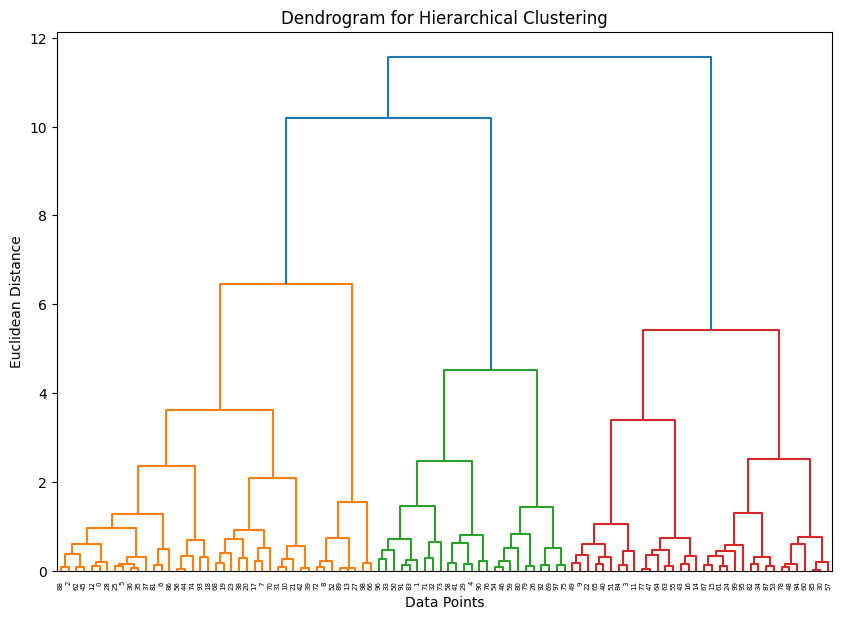

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt

# 예시 데이터 생성
np.random.seed(0)
lon = np.random.uniform(127.3, 127.4, 100)  # 경도
lat = np.random.uniform(36.3, 36.4, 100)  # 위도
speeding = np.random.randint(0, 2, 100)  # 과속 여부
sudden_acceleration = np.random.randint(0, 2, 100)  # 급가속

data = pd.DataFrame({
    'lon': lon,
    'lat': lat,
    'Speeding': speeding,
    'Sudden_acceleration': sudden_acceleration
})

# 데이터 전처리: 경도와 위도 데이터 표준화
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[['lon', 'lat']])

# Hierarchical Clustering
linked = linkage(data_scaled, 'ward')

# 덴드로그램 그리기
plt.figure(figsize=(10, 7))
dendrogram(linked, orientation='top', distance_sort='descending', show_leaf_counts=True)
plt.title('Dendrogram for Hierarchical Clustering')
plt.xlabel('Data Points')
plt.ylabel('Euclidean Distance')
plt.show()


In [34]:
import pandas as pd

GEO_DTG = pd.read_pickle("/home/user/jin_jb/DTG/DATA/GEO_DTG.pkl")

GEO_DTG_spot = GEO_DTG[['lon','lat']]

In [35]:
GEO_DTG_spot

,lon,lat
0,127.379560,36.355946
1,127.379560,36.355946
2,127.379281,36.355766
3,127.379281,36.355766
4,127.379560,36.355946
...,...,...
1863692,127.377793,36.416744
1863693,127.377793,36.416744
1863694,127.334089,36.301538
1863695,127.334089,36.301538


In [ ]:
from sklearn.cluster import DBSCAN
import geopandas as gpd
import folium
import numpy as np
import pandas as pd

# 예시 데이터 생성
np.random.seed(1)
example_lon = np.random.uniform(127.3, 127.4, 100)  # 대전 지역 경도 범위
example_lat = np.random.uniform(36.3, 36.4, 100)  # 대전 지역 위도 범위
example_data = pd.DataFrame({
    'lon': example_lon,
    'lat': example_lat
})

# DBSCAN 클러스터링
# eps: 이웃을 정의하기 위한 최대 거리, min_samples: 핵심 포인트를 정의하기 위한 이웃 수
dbscan = DBSCAN(eps=0.01, min_samples=5)
example_data['Cluster'] = dbscan.fit_predict(example_data[['lon', 'lat']])

# 클러스터링 결과 시각화 (수정)
map = folium.Map(location=[36.35, 127.35], zoom_start=13)
colors = ['red', 'green', 'blue', 'purple', 'orange', 'darkred', 'lightred', 'beige', 'darkblue', 'darkgreen', 'cadetblue', 'darkpurple', 'white', 'pink', 'lightblue', 'lightgreen', 'gray', 'black', 'lightgray']

for _, row in example_data.iterrows():
    cluster = int(row['Cluster'])  # 클러스터 값을 int로 변환
    # 클러스터가 -1인 경우 (잡음), 검은색으로 표시
    color = 'black' if cluster == -1 else colors[cluster % len(colors)]
    
    folium.CircleMarker(
        
        location=[row['lat'], row['lon']],
        radius=5,
        color=color,
        fill=True,
        fill_color=color
    ).add_to(map)

map


In [ ]:
from sklearn.cluster import DBSCAN
import geopandas as gpd
import folium

# DBSCAN 클러스터링
dbscan = DBSCAN(eps=0.0018, min_samples=5)  # 파라미터는 데이터에 따라 조정 필요
spot['Cluster'] = dbscan.fit_predict(spot[['lon', 'lat']])

# 클러스터링 결과 시각화
map = folium.Map(location=[36.35, 127.38], zoom_start=11)  # 대전 지역을 중심으로 설정
colors = ['red', 'green', 'blue', 'purple', 'orange', 'darkred', 'lightred', 'beige', 'darkblue', 'darkgreen', 'cadetblue', 'darkpurple', 'white', 'pink', 'lightblue', 'lightgreen', 'gray', 'black', 'lightgray']

for _, row in spot.iterrows():
    cluster = int(row['Cluster'])
    color = 'gray' if cluster == -1 else colors[cluster % len(colors)]  # 잡음은 회색, 클러스터는 파란색으로 표시
    
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=2,
        color=color,
        fill=True,
        fill_color=color
    ).add_to(map)

map


/tmp/ipykernel_123109/1372901786.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  spot['Cluster'] = dbscan.fit_predict(spot[['lon', 'lat']])


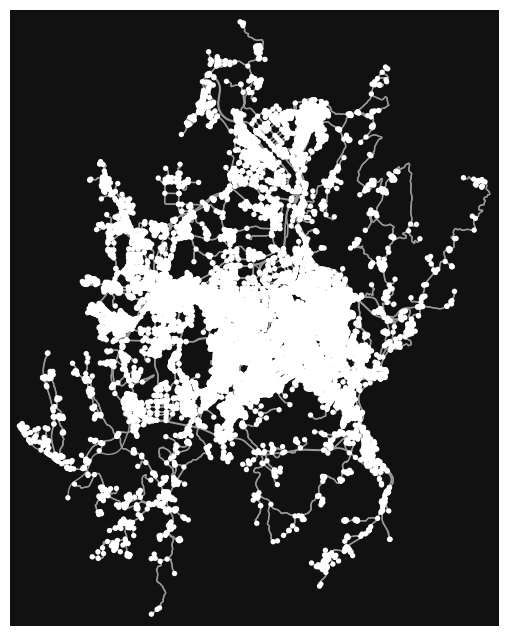

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [37]:
import osmnx as ox

# 관심 지역의 도로 네트워크 다운로드
place_name = "Daejeon, South Korea"
graph = ox.graph_from_place(place_name, network_type='drive')
roads_gdf = ox.graph_to_gdfs(graph, nodes=False)

# 도로 네트워크 시각화
ox.plot_graph(ox.project_graph(graph))

/tmp/ipykernel_103437/737512292.py:13: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf_edges['geometry'] = gdf_edges.geometry.buffer(0.0001)  # 대략 10m 폭, 좌표계에 따라 조정 필요


<Axes: >

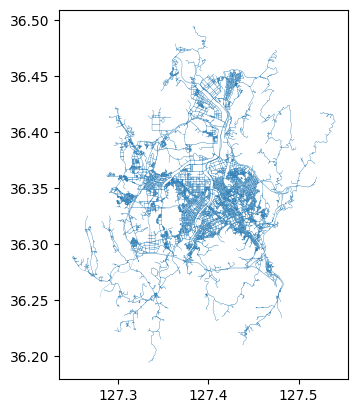

In [ ]:
import osmnx as ox
import geopandas as gpd

# 대전 지역의 도로 네트워크 다운로드
place_name = "Daejeon, South Korea"
graph = ox.graph_from_place(place_name, network_type='drive')

# 그래프에서 노드와 엣지를 GeoDataFrame으로 변환
gdf_nodes, gdf_edges = ox.graph_to_gdfs(graph)

# 각 도로 세그먼트에 대한 버퍼 생성 (예: 도로 폭을 고려한 버퍼)
# 여기서는 단순화를 위해 모든 도로에 대해 동일한 폭(예: 10m)을 가정
gdf_edges['geometry'] = gdf_edges.geometry.buffer(0.0001)  # 대략 10m 폭, 좌표계에 따라 조정 필요

# 버퍼링된 도로 경계 확인
gdf_edges.plot()

# # 필요시 GeoDataFrame을 파일로 저장
# gdf_edges.to_file("daejeon_road_boundaries.geojson", driver='GeoJSON')


In [ ]:
# 도로 네트워크 확인
roads_gdf = roads_gdf.reset_index()

In [ ]:
roads_gdf

,u,v,key,osmid,oneway,lanes,highway,maxspeed,reversed,length,geometry,name,ref,bridge,tunnel,access,junction
0,274940138,8234413963,0,124013597,True,1,motorway_link,40,False,260.691,"LINESTRING (127.37828 36.41666, 127.37915 36.4...",NaN,NaN,NaN,NaN,NaN,NaN
1,275898514,8964537398,0,124013597,True,1,motorway_link,40,False,17.568,"LINESTRING (127.37769 36.41697, 127.37781 36.4...",NaN,NaN,NaN,NaN,NaN,NaN
2,275898514,436793845,0,37397677,False,NaN,residential,NaN,False,462.029,"LINESTRING (127.37769 36.41697, 127.37764 36.4...",대덕대로989번길,NaN,NaN,NaN,NaN,NaN
3,275898514,8234413994,0,124013611,True,NaN,secondary,NaN,False,650.453,"LINESTRING (127.37769 36.41697, 127.37767 36.4...",대덕대로,32;57,NaN,NaN,NaN,NaN
4,275898563,8234413970,0,774882403,True,4,secondary,60,False,411.024,"LINESTRING (127.37784 36.41119, 127.37802 36.4...",대덕대로,32;57,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43458,11515615424,387271437,0,470198454,False,4,secondary,70,False,259.858,"LINESTRING (127.39070 36.35977, 127.39204 36.3...",청사로,NaN,NaN,NaN,NaN,NaN
43459,11515615424,278125515,0,1239558233,True,4,secondary,70,False,39.452,"LINESTRING (127.39070 36.35977, 127.39053 36.3...",청사로,NaN,NaN,NaN,NaN,NaN
43460,11515615426,278125515,0,1239558235,False,4,secondary,70,True,8.162,"LINESTRING (127.39027 36.35973, 127.39027 36.3...",문예로,NaN,NaN,NaN,NaN,NaN
43461,11515615426,387271429,0,979941396,False,4,secondary,70,False,109.861,"LINESTRING (127.39027 36.35973, 127.39027 36.3...",문예로,NaN,NaN,NaN,NaN,NaN


In [43]:
GEO_DTG

,OPT_DT,HOUR,TRANSCO_CD,CAR_REG_NO,TRIP_ID,OPT_SPD,Speeding,Long-term speeding,Sudden acceleration,Sudden start,...,Sudden overtaking,Sudden lane change,EMD_CD,EMD_NM,DAY_CD,ACC_GRD_CD,DEATH_CNT,WND_CNT,lon,lat
0,2019-01-01,19,17827,대전50바8429,C대전50바842919010117303000,26,0,0,1,0,...,0,0,30170112,둔산동,3,1,1,0,127.379560,36.355946
1,2019-01-01,19,17827,대전50바8429,C대전50바842919010117303000,90,1,0,0,0,...,0,0,30170112,둔산동,3,1,1,0,127.379560,36.355946
2,2019-01-01,18,17821,대전50바7636,C대전50바763619010103514200,60,0,0,0,0,...,0,0,30170112,둔산동,3,3,0,2,127.379281,36.355766
3,2019-01-01,18,17821,대전50바7636,C대전50바763619010103514200,60,0,0,0,0,...,0,0,30170112,둔산동,3,3,0,2,127.379281,36.355766
4,2019-01-01,19,17821,대전50바7636,C대전50바763619010103514200,60,0,0,0,0,...,0,0,30170112,둔산동,3,1,1,0,127.379560,36.355946
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1863692,2019-12-31,11,29525,대구84아9597,C대구84아959719123110140000,146,0,0,0,0,...,0,0,30200130,화암동,3,3,0,1,127.377793,36.416744
1863693,2019-12-31,11,29525,대구84아9597,C대구84아959719123110140000,71,1,0,0,0,...,0,0,30200130,화암동,3,3,0,1,127.377793,36.416744
1863694,2019-12-31,10,29787,인천85아1835,C인천85아183519123110330000,15,0,0,1,0,...,0,0,30170116,관저동,3,2,0,2,127.334089,36.301538
1863695,2019-12-31,10,29787,인천85아1835,C인천85아183519123110330000,18,0,0,1,0,...,0,0,30170116,관저동,3,2,0,2,127.334089,36.301538


In [38]:
import geopandas as gpd
from shapely.geometry import Point

# 교통사고 데이터를 GeoDataFrame으로 변환
accidents_gdf = gpd.GeoDataFrame(GEO_DTG, geometry=gpd.points_from_xy(GEO_DTG.lon, GEO_DTG.lat))


# 공간 조인을 통해 각 사고가 발생한 도로 식별
joined_data = gpd.sjoin(accidents_gdf, roads_gdf, how="inner", op='intersects')

# 결과 분석 및 처리


/home/user/.local/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3448: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):
/tmp/ipykernel_346628/4261208317.py:9: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  joined_data = gpd.sjoin(accidents_gdf, roads_gdf, how="inner", op='intersects')


In [39]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import osmnx as ox

# 교통사고 데이터를 GeoDataFrame으로 변환
accidents_gdf = gpd.GeoDataFrame(GEO_DTG, geometry=gpd.points_from_xy(GEO_DTG.lon, GEO_DTG.lat))

# OSMnx를 사용하여 도로 네트워크 데이터 가져오기
place_name = "Daejeon, South Korea"
graph = ox.graph_from_place(place_name, network_type='drive')
roads_gdf = ox.graph_to_gdfs(graph, nodes=False)

# accidents_gdf의 좌표계 설정 (도로 네트워크 데이터와 일치시키기)
accidents_gdf.set_crs(roads_gdf.crs, inplace=True)

# 공간 조인을 통해 각 사고가 발생한 도로 식별
joined_data = gpd.sjoin(accidents_gdf, roads_gdf, how="inner", predicate='intersects')


In [42]:
accidents_gdf

,OPT_DT,HOUR,TRANSCO_CD,CAR_REG_NO,TRIP_ID,OPT_SPD,Speeding,Long-term speeding,Sudden acceleration,Sudden start,...,Sudden lane change,EMD_CD,EMD_NM,DAY_CD,ACC_GRD_CD,DEATH_CNT,WND_CNT,lon,lat,geometry
0,2019-01-01,19,17827,대전50바8429,C대전50바842919010117303000,26,0,0,1,0,...,0,30170112,둔산동,3,1,1,0,127.379560,36.355946,POINT (127.37956 36.35595)
1,2019-01-01,19,17827,대전50바8429,C대전50바842919010117303000,90,1,0,0,0,...,0,30170112,둔산동,3,1,1,0,127.379560,36.355946,POINT (127.37956 36.35595)
2,2019-01-01,18,17821,대전50바7636,C대전50바763619010103514200,60,0,0,0,0,...,0,30170112,둔산동,3,3,0,2,127.379281,36.355766,POINT (127.37928 36.35577)
3,2019-01-01,18,17821,대전50바7636,C대전50바763619010103514200,60,0,0,0,0,...,0,30170112,둔산동,3,3,0,2,127.379281,36.355766,POINT (127.37928 36.35577)
4,2019-01-01,19,17821,대전50바7636,C대전50바763619010103514200,60,0,0,0,0,...,0,30170112,둔산동,3,1,1,0,127.379560,36.355946,POINT (127.37956 36.35595)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1863692,2019-12-31,11,29525,대구84아9597,C대구84아959719123110140000,146,0,0,0,0,...,0,30200130,화암동,3,3,0,1,127.377793,36.416744,POINT (127.37779 36.41674)
1863693,2019-12-31,11,29525,대구84아9597,C대구84아959719123110140000,71,1,0,0,0,...,0,30200130,화암동,3,3,0,1,127.377793,36.416744,POINT (127.37779 36.41674)
1863694,2019-12-31,10,29787,인천85아1835,C인천85아183519123110330000,15,0,0,1,0,...,0,30170116,관저동,3,2,0,2,127.334089,36.301538,POINT (127.33409 36.30154)
1863695,2019-12-31,10,29787,인천85아1835,C인천85아183519123110330000,18,0,0,1,0,...,0,30170116,관저동,3,2,0,2,127.334089,36.301538,POINT (127.33409 36.30154)
